<center><h1>Maltese Christian Statue (MCS) Classifier</h1>
<h2>Matthias Bartolo</h2>

</center>

### Import TensorFlow

`For native GPU support on Windows, you will need to install the following:`
<font size="0.7">

```python
conda install -c conda-forge cudatoolkit=11.2 cudnn=8.1.0
# Anything above 2.10 is not supported on the GPU on Windows Native
python -m pip install "tensorflow<2.11"
# Verify the installation:
python -c "import tensorflow as tf; print(tf.config.list_physical_devices('GPU'))"
```

</font>

In [1]:
from time import time
import tensorflow as tf
import numpy as np
import seaborn as sns
import os
import cv2

import keras
from keras import backend as K
import matplotlib.pyplot as plt
from matplotlib import patches
from tensorflow.keras import datasets, layers, models
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import SGD, RMSprop, Adagrad, Adadelta, Adam, Adamax, Nadam
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings("ignore")

print(tf.__version__)
print(tf.config.list_physical_devices('GPU'))

2.10.1
[]


### Preparing the MCS dataset


The Dataset features 13 Categories of Christian Statues found in Malta specifically in the parish church of `Ħaż-Żebbuġ` dedicated to `St Philip of Agira`. Note that the images retrieved for the creation of such dataset, were extracted from public domain sources and are not intended for commercial use.

In [2]:
# Defining the dataset path
dataset_path = '../MCS Dataset/'

# Retrieving the categories
categories = os.listdir(dataset_path)

# Printing the categories
for i, category in enumerate(categories):
    print('\033[35m' + str(i) + '. ' + category + '\033[0m')

0. Jesus has Risen
1. Jesus praying in Gethsemane
2. Saint Philip of Agira
3. Simon of Cyrene
4. The Betrayal of Judas
5. The Cross
6. The Crucifixion
7. The Ecce Homo
8. The Flogged
9. The Lady of Sorrows
10. The Monument
11. The Redeemer
12. The Veronica


### Loading and Preprocessing the Dataset

The dataset will be loaded and split into training and validation sets. The images will be resized to `244x244` pixels and normalized.

In [3]:
# Loading the dataset from the directory
image_distribution = {}
size = (244, 244)

# Initialize lists to store images and labels
images = []
labels = []

# Initialize image_distribution dictionary
image_distribution = {}

# Iterate through the categories
for i, category in enumerate(categories):
    # Retrieve the images in each category directory
    image_names = os.listdir(os.path.join(dataset_path, category))
    
    # Store the count of images in each category
    image_distribution[category] = len(image_names)
    
    # Iterate through the images in the category
    for image_name in image_names:
        # Read the image
        img_path = os.path.join(dataset_path, category, image_name)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, size)  # Resize the image if necessary
        
        # Append the image to the list
        images.append(img)
        
        # Append the label (category index) to the labels list
        labels.append(i)

# Convert lists to numpy arrays
images = np.array(images)
labels = np.array(labels)

# Shuffle the data
indices = np.arange(len(images))
np.random.shuffle(indices)
images = images[indices]
labels = labels[indices]

# Printing the total number of images in the dataset
print('\033[35m'+ 'The Total Number of Images in the Dataset: ' + str(len(images)) + '\033[0m')

The Total Number of Images in the Dataset: 2076


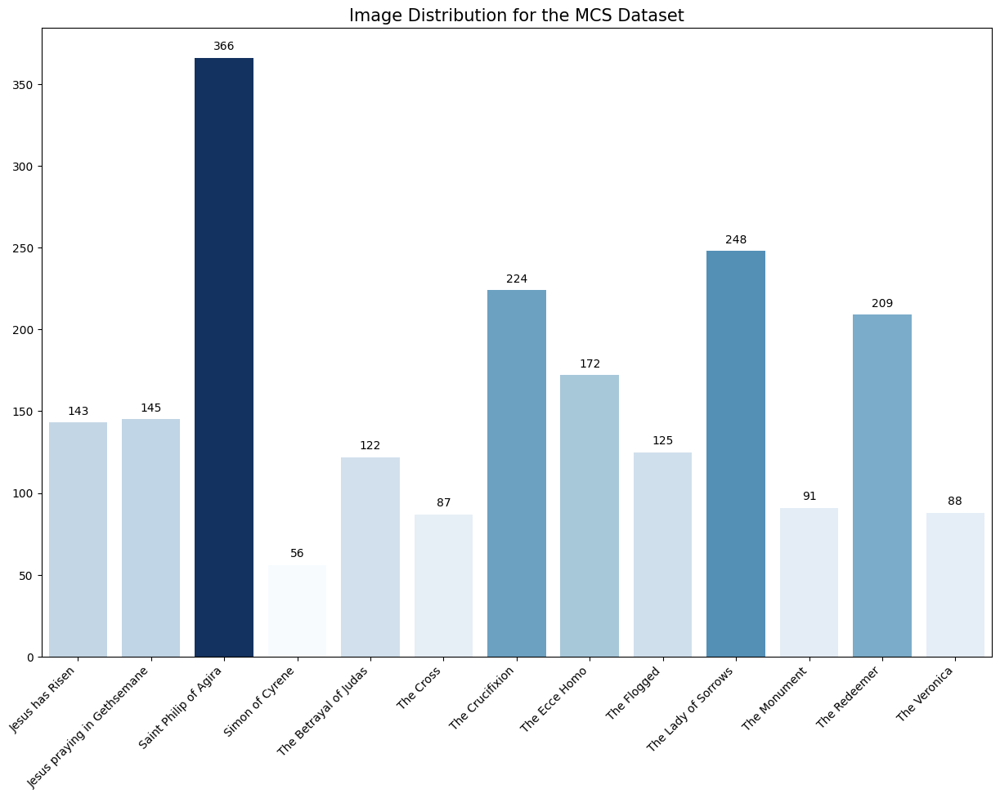

In [4]:
# Plotting the image distribution
plt.figure(figsize=(15, 10))

# Normalize the values for color mapping
norm = plt.Normalize(min(image_distribution.values()), max(image_distribution.values()))
colors = plt.cm.Blues(norm(list(image_distribution.values())))

barplot = sns.barplot(x=list(image_distribution.keys()), y=list(image_distribution.values()), palette=colors)

# Add numbers above the bars
for p in barplot.patches:
    barplot.annotate(format(p.get_height(), '.0f'), 
                     (p.get_x() + p.get_width() / 2., p.get_height()), 
                     ha = 'center', va = 'center', 
                     xytext = (0, 10), 
                     textcoords = 'offset points')

plt.title('Image Distribution for the MCS Dataset', fontsize=15)

# Slant the x-axis labels by 45 degrees and adjust alignment
plt.xticks(rotation=45, ha='right')

plt.show()

In [5]:
# Splitting the dataset into training and testing sets (80% training, 20% testing)
train_images, test_images, train_labels, test_labels = train_test_split(images, labels, test_size=0.2, random_state=42)

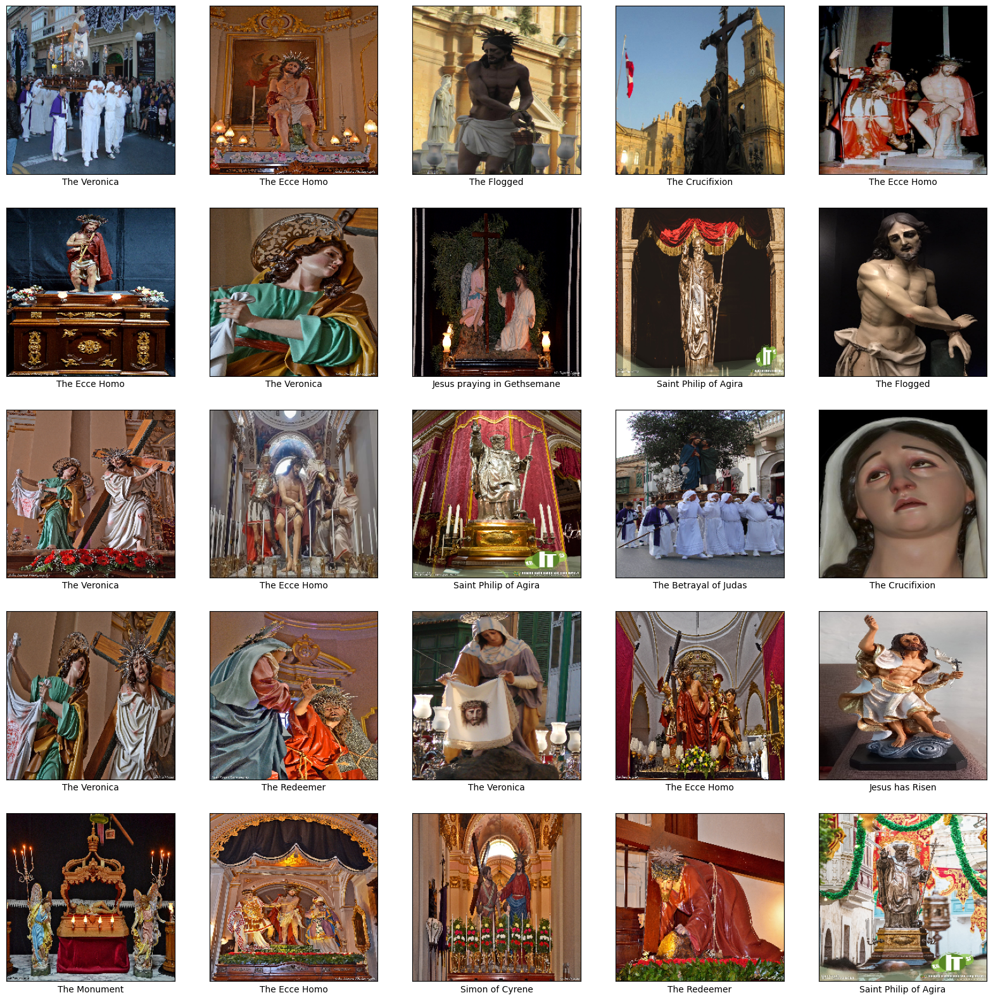

In [6]:
# Plotting the first 25 images from the training set and displaying the class name below each image
plt.figure(figsize=(20,20))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(train_images[i])
    plt.xlabel(categories[train_labels[i]])
plt.show()

### Creating Fit Function

Following the `Keras` API, we create a `fit` function that will be used to train our model. As the name implies the `fit` function will be used to fit the model to the training data. The `fit` function will take in the following parameters:
- `model`: The model to be trained
- `epochs`: The number of epochs to train the model for
- `optimizer`: The optimizer to be used to train the model
- `verbose`: The verbosity level of the training process
- `batch_size`: The batch size used for training
- `callbacks`: List of callbacks to be used during training
- `colors`: Tuple of colors to be used for plotting
- `do_display`: Whether to display the training process
- `do_save`: Whether to save the trained model
- `save_name`: Name of the saved model

The `fit` function will compile the model with the specified optimizer and loss function. It will then train the model using the training data and evaluate its performance on the validation data. After training, it will plot the training curves and display the test accuracy, test loss, precision, recall, and F1 score. If specified, it will also display the confusion matrix and save the trained model.


In [7]:
def fit(model, epochs:int=100, optimizer=Adam(clipnorm=1.0), verbose:int=1, batch_size:int=256, callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True), ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)], colors:tuple=('blue','purple','green','cyan'), do_display:bool=False, do_save:bool=False, save_name:str='model'):
    """Function which fits a model to the training data and plots the training process.

    Args:
        model (keras.model): Model to fit
        epochs (int, optional): Number of epochs to train for. Defaults to 10.
        optimizer (str, optional): Optimizer to use. Defaults to 'adam'.
        verbose (int, optional): Verbosity of training. Defaults to 1.
        batch_size (int, optional): Batch size. Defaults to 32.
        callbacks (list, optional): List of callbacks. Defaults to [EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)].
        colors (tuple, optional): Colors to use for plotting. Defaults to ('blue','purple','green','cyan').`
        do_save (bool, optional): Whether to save the model. Defaults to False.
        save_name (str, optional): Name of the model to save. Defaults to 'model'.
    """

    # Loading the model
    model.compile(optimizer=optimizer,
                    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                    metrics=['accuracy'])

    # Printing the model summary
    print(model.summary())

    # Setting the start time
    s=time()

    # Creating data augmentation (to prevent overfitting)
    datagen = keras.preprocessing.image.ImageDataGenerator(
        rotation_range=10,            # Random rotation between 0 and 10 degrees
        width_shift_range=0.1,        # Randomly shift the width by up to 10% of the total width
        height_shift_range=0.1,       # Randomly shift the height by up to 10% of the total height
        shear_range=0.2,              # Shear angle in counter-clockwise direction in radians
        zoom_range=0.2,               # Random zoom between 0.8x and 1.2x
        horizontal_flip=True,         # Randomly flip inputs horizontally
        vertical_flip=True,           # Randomly flip inputs vertically
        fill_mode='nearest'           # How to fill newly created pixels, here it's using the nearest neighbor value
    )

    datagen.fit(train_images)

    # Fitting the model
    history = model.fit(
        datagen.flow(train_images, train_labels, batch_size=batch_size),
        verbose=verbose,
        steps_per_epoch=train_images.shape[0] // batch_size,
        epochs=epochs,
        validation_data=(test_images, test_labels),
        callbacks=callbacks,
    )

    # Printing the training time
    print(f'\033[36mTraining Time: {round(time()-s,2)}s\033[0m')
    print('*'*50)

    # Plotting Training process
    plt.figure(figsize=(15,10))
    plt.style.use('seaborn-v0_8')
    plt.plot(history.history['accuracy'], label='Train Accuracy', color = colors[0])
    plt.plot(history.history['loss'], label = 'Train Loss', color = colors[1], linestyle='dashed')
    plt.plot(history.history['val_accuracy'], label = 'Validation Accuracy', color = colors[2])
    plt.plot(history.history['val_loss'], label = 'Validation Loss', color = colors[3], linestyle='dashed')
    plt.title('Training Curves', fontsize=17)
    plt.xlabel('Epoch', fontsize=14)
    plt.ylabel('Accuracy', fontsize=14)
    plt.legend(loc='upper right')
    plt.grid(True)
    plt.show()

    # Testing the model
    test_loss, test_acc = model.evaluate(test_images,  test_labels, verbose=2)

    # Calculating the Precision, Recall and F1 Score
    y_pred = model.predict(test_images)
    y_pred = [np.argmax(i) for i in y_pred]
    
    # Printing the test results
    print(f'\033[35mTest Accuracy: {round(test_acc,2)}\033[0m')
    print(f'\033[34mTest Loss: {round(test_loss,2)}\033[0m')
    print(f'\033[33mTest Precision: {round(precision_score(test_labels, y_pred, average="weighted"),2)}\033[0m')
    print(f'\033[32mTest Recall: {round(recall_score(test_labels, y_pred, average="weighted"),2)}\033[0m')
    print(f'\033[31mTest F1 Score: {round(f1_score(test_labels, y_pred, average="weighted"),2)}\033[0m')

    # Plotting the confusion matrix
    if do_display:
        cm = confusion_matrix(test_labels, y_pred)
        plt.figure(figsize=(15,10))
        plt.title('Confusion Matrix', fontsize=17)
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=categories, yticklabels=categories)
        plt.xticks(fontsize=12, rotation=45, ha='right')
        plt.yticks(fontsize=12)
        plt.ylabel('Actual', fontsize=14)
        plt.xlabel('Predicted', fontsize=14)
        plt.show()

    # Saving the model
    if do_save:
        model.save(f'{save_name}.h5')

    return test_acc

### Model Creation & Training

#### VGG16 Model

Creating a Convolutional Neural Network (CNN) model using the `Keras` API. The model will consist of the following layers:
- `VGG16 Base Model` with `imagenet` weights without the final layer
- `Flatten Layer`
- `Dense Layer with 1024 units and ReLU activation`
- `Dense Layer with 512 units and ReLU activation`
- `Dense Layer with 13 units and softmax activation`

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 244, 244, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 244, 244, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 244, 244, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 122, 122, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 122, 122, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 122, 122, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 61, 61, 128)       0     

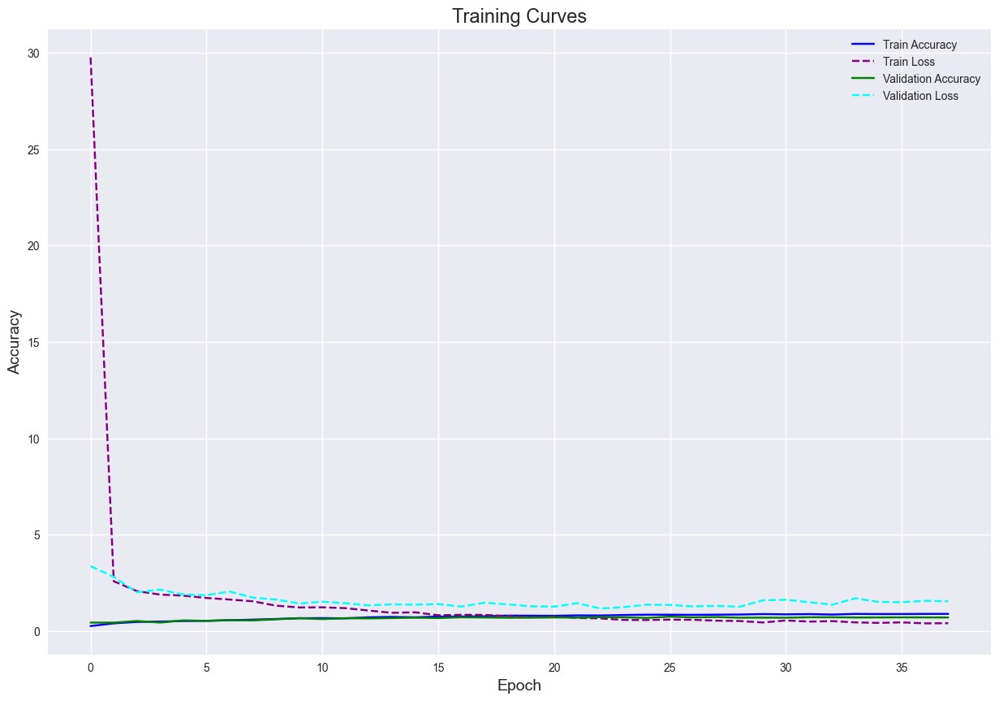

13/13 - 12s - loss: 1.1587 - accuracy: 0.7139 - 12s/epoch - 905ms/step
13/13 [==============================] - 12s 896ms/step
Test Accuracy: 0.71
Test Loss: 1.16
Test Precision: 0.73
Test Recall: 0.71
Test F1 Score: 0.72


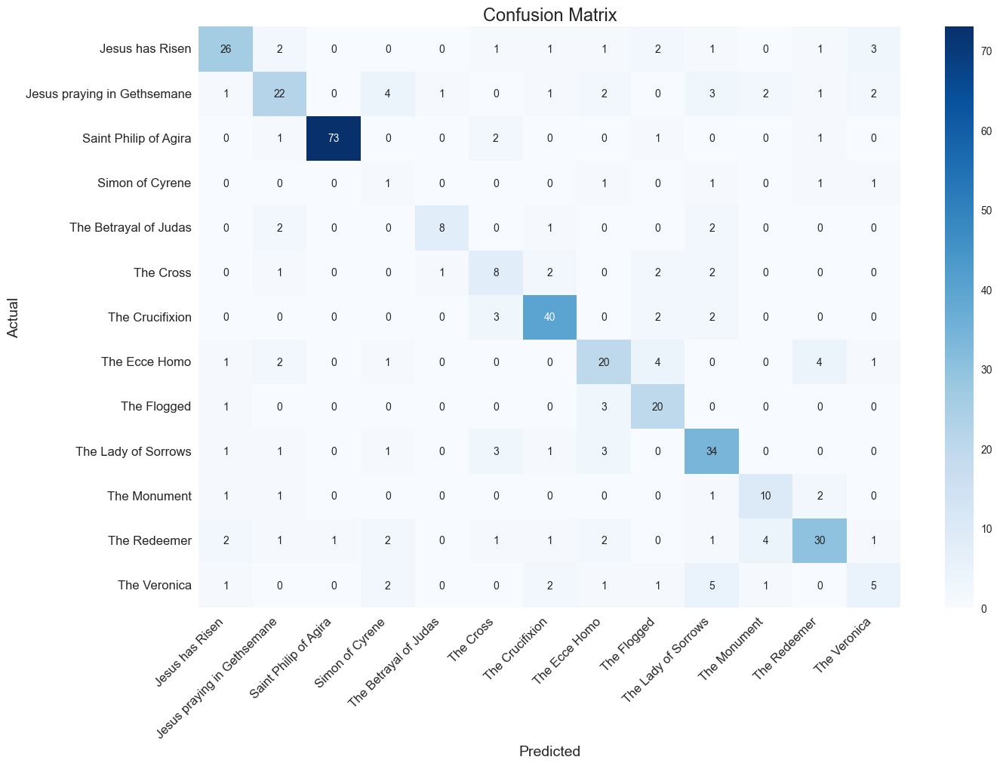

In [8]:
# Variable to determine whether to retrain the model
train_model = True

# Retraining the VGG16 model with the new dataset from keras.applications import VGG16
from keras.applications import VGG16

# Loading the VGG16 model
model = VGG16(weights='imagenet', include_top=False, input_shape=(244, 244, 3))

# Freezing the layers in the model
for layer in model.layers:
    layer.trainable = False

# Adding the classification layers to the model
flat1 = layers.Flatten()(model.layers[-1].output)
class1 = layers.Dense(1024, activation='relu')(flat1)
class2 = layers.Dense(512, activation='relu')(class1)
output = layers.Dense(len(categories), activation='softmax')(class2)

# Defining the new model
model = models.Model(inputs=model.inputs, outputs=output)

# Fitting the model
if train_model:
    _ = fit(model, 
            epochs=100, 
            optimizer=Adam(clipnorm=1.0), 
            verbose=1, 
            batch_size=32, 
            callbacks=[EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True), ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=15, min_lr=0.00001)], 
            colors=('blue','purple','green','cyan'), 
            do_display=True, 
            do_save=True, 
            save_name='VGG16')


#### MobileNet Model

Creating a Convolutional Neural Network (CNN) model using the `Keras` API. The model will consist of the following layers:
- `MobileNet Base Model` with `imagenet` weights without the final layer
- `Flatten Layer`
- `Dense Layer with 1024 units and ReLU activation`
- `Dense Layer with 512 units and ReLU activation`
- `Dense Layer with 13 units and softmax activation`

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 244, 244, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 122, 122, 32)      864       
                                                                 
 conv1_bn (BatchNormalizatio  (None, 122, 122, 32)     128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (None, 122, 122, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (None, 122, 122, 32)     288       
                                                                 
 conv_dw_1_bn (BatchNormaliz  (None, 122, 122, 32)     128       
 ation)                                                    

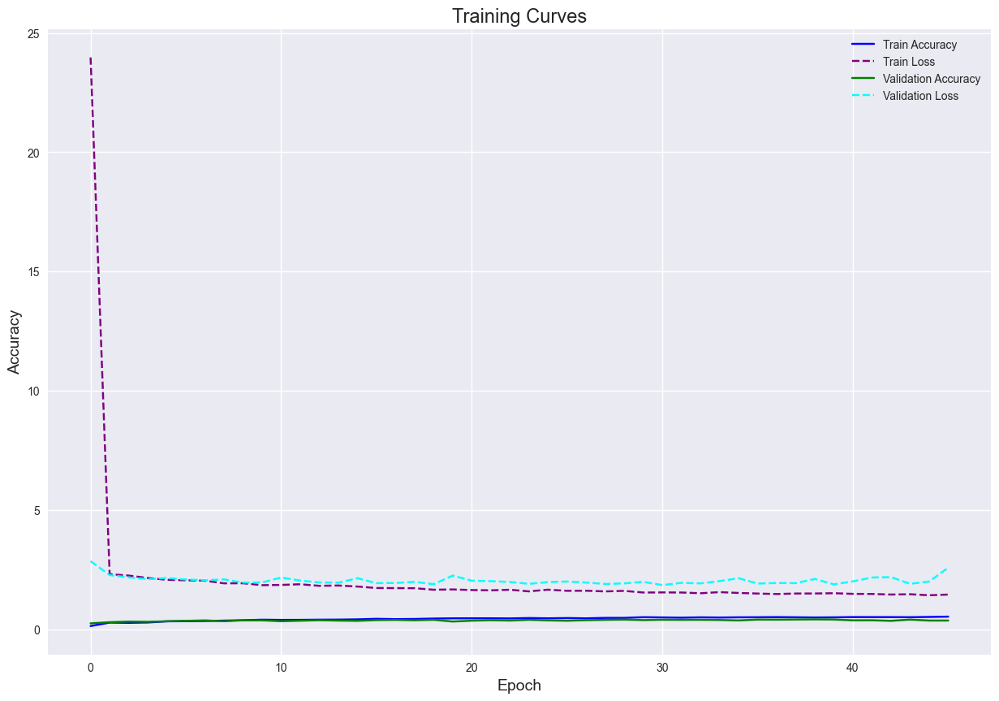

13/13 - 3s - loss: 1.8531 - accuracy: 0.3990 - 3s/epoch - 232ms/step
13/13 [==============================] - 3s 229ms/step
Test Accuracy: 0.4
Test Loss: 1.85
Test Precision: 0.34
Test Recall: 0.4
Test F1 Score: 0.36


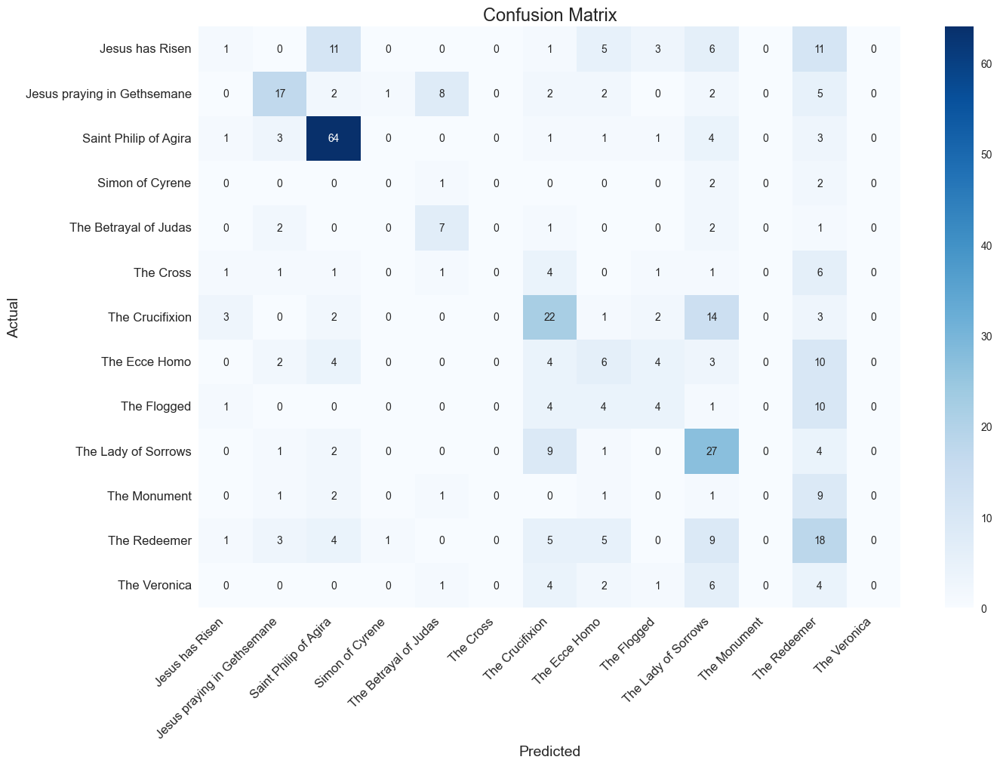

In [9]:
# Variable to determine whether to retrain the model
train_model = True

# Retraining the MobileNet model with the new dataset from keras.applications import VGG16
from keras.applications import MobileNet

# Loading the MobileNet model
model = MobileNet(weights='imagenet', include_top=False, input_shape=(244, 244, 3))

# Freezing the layers in the model
for layer in model.layers:
    layer.trainable = False

# Adding the classification layers to the model
flat1 = layers.Flatten()(model.layers[-1].output)
class1 = layers.Dense(1024, activation='relu')(flat1)
class2 = layers.Dense(512, activation='relu')(class1)
output = layers.Dense(len(categories), activation='softmax')(class2)

# Defining the new model
model = models.Model(inputs=model.inputs, outputs=output)

# Fitting the model
if train_model:
    _ = fit(model, 
            epochs=100, 
            optimizer=Adam(clipnorm=1.0), 
            verbose=1, 
            batch_size=32, 
            callbacks=[EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True), ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=15, min_lr=0.00001)], 
            colors=('blue','purple','green','cyan'), 
            do_display=True, 
            do_save=True, 
            save_name='MobileNet')


### Prediction on Images

In [10]:
def predict(image_dict, model, do_save=True, size=(244, 244)):
    """Function to predict the class of an image using the model.

    Args:
        image_dict (dict): Dictionary containing the image paths.
        model (keras.model): Model to use for prediction.
        do_save (bool, optional): Whether to save the predictions. Defaults to True.
        size (tuple, optional): Size of the image. Defaults to (244, 244).

    Returns:
        predictions: List of predictions and images.
    """
    # Initializing the predictions list
    predictions = []

    # Iterating through the image dictionary
    for key, image in image_dict.items():
        # Resizing the image
        img = image.copy()
        img = cv2.resize(img, size)
        img = np.expand_dims(img, axis=0)

        # Predicting the class of the image
        pred = model.predict(img)
        pred_class = np.argmax(pred)

        # Calculating prediction probability
        pred_prob = round(np.max(pred) * 100, 2)

        # Plotting the image with the predicted class
        plt.figure(figsize=(10, 7))
        plt.rcParams['figure.figsize'] = (10, 7)
        plt.rcParams['axes.titlesize'] = 20
        plt.imshow(image)
        plt.title(f'Predicting image: {key}', fontsize=25)

        # Creating a bounding box around the whole image
        ax = plt.gca()
        rect = patches.Rectangle((0, 0), image.shape[1], image.shape[0], linewidth=3, edgecolor='r', facecolor='none')
        ax.add_patch(rect)

        # Adding the best prediction text to the image with a red background and white font
        annotation_text = f'{categories[pred_class]}: {pred_prob}%'
        plt.annotate(annotation_text, xy=(0, 0), fontsize=20, color='white', backgroundcolor='red', va='top', ha='left')
        plt.axis('off') 
        
        # Saving the figure
        if do_save:
            os.makedirs('Predictions', exist_ok=True)
            plt.savefig(f'Predictions/{key}.png')

        # Appending the prediction and image to the predictions list
        predictions.append((key, categories[pred_class], pred_prob, image))

    return predictions

1/1 [==============================] - 0s 104ms/step


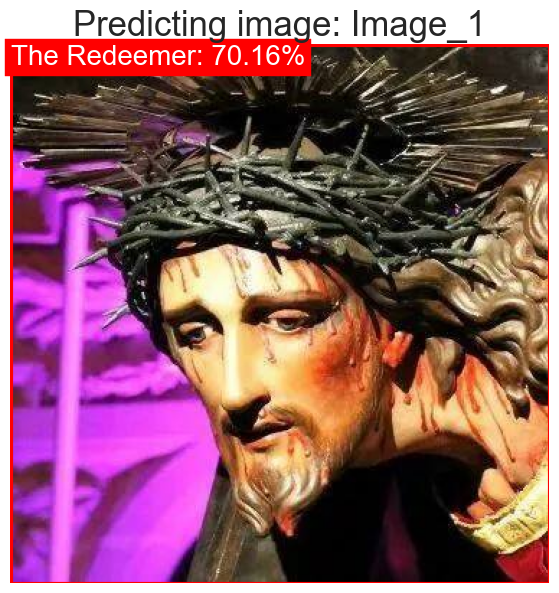

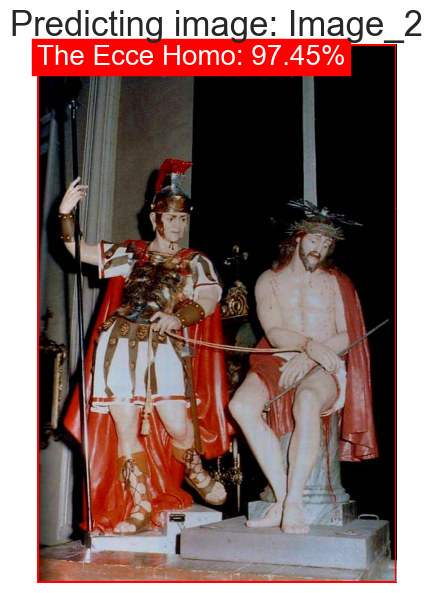

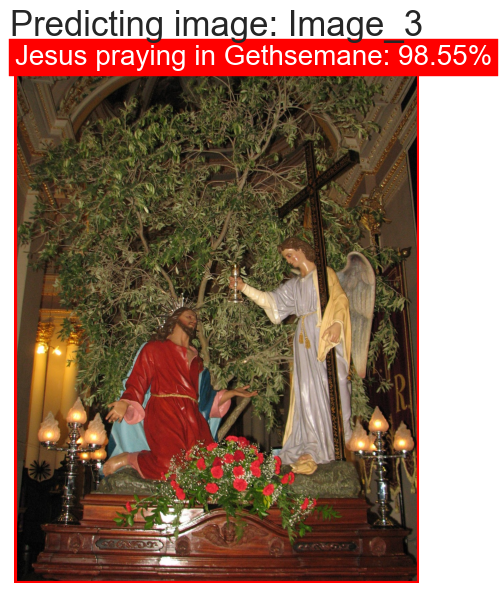

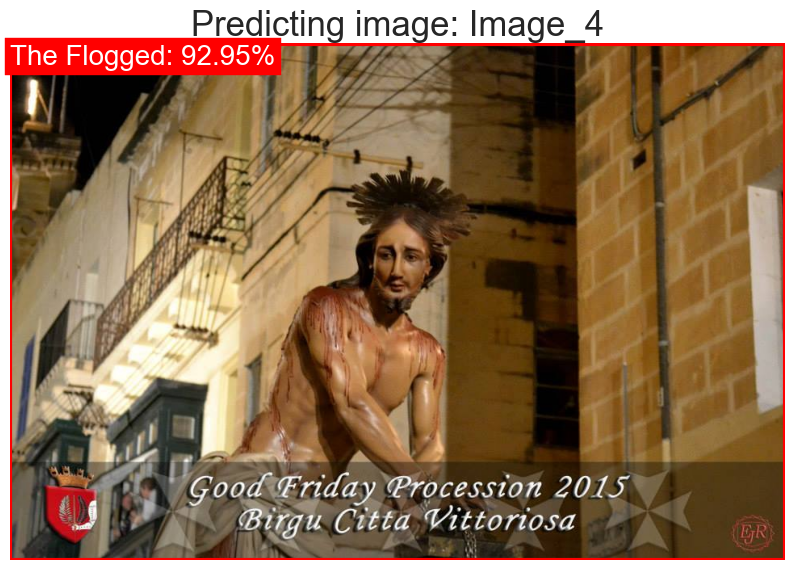

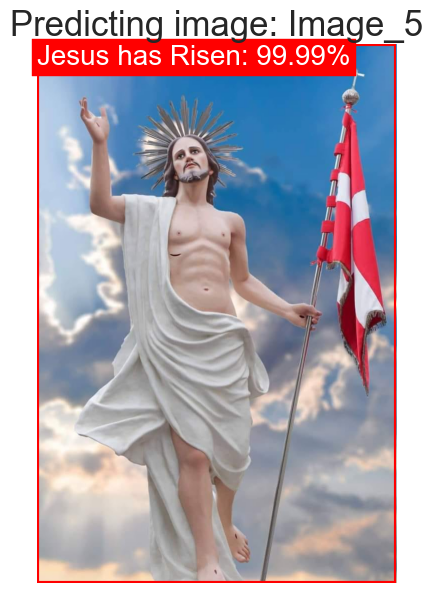

...

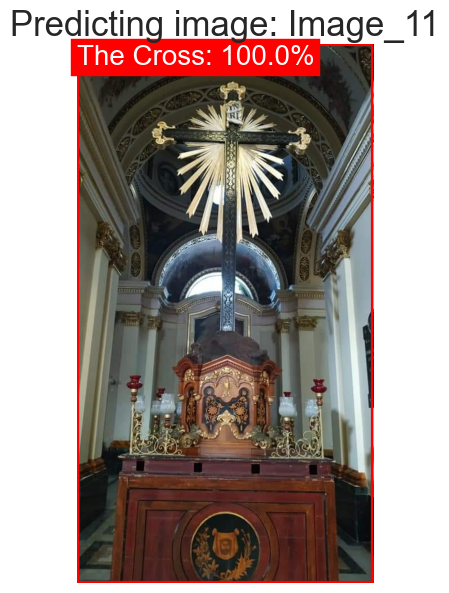

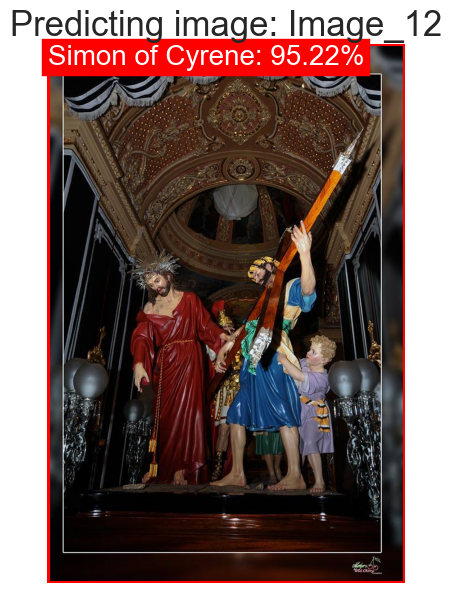

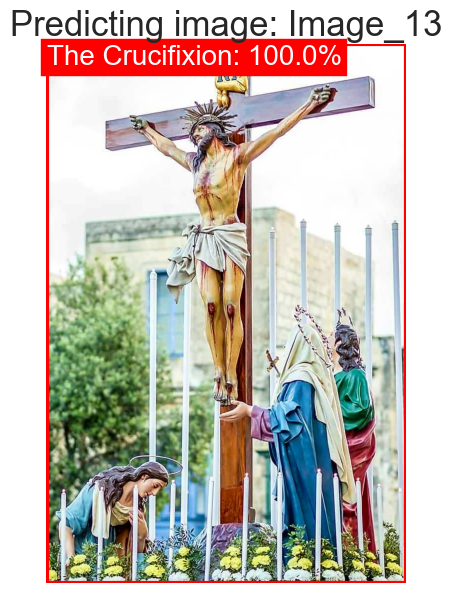

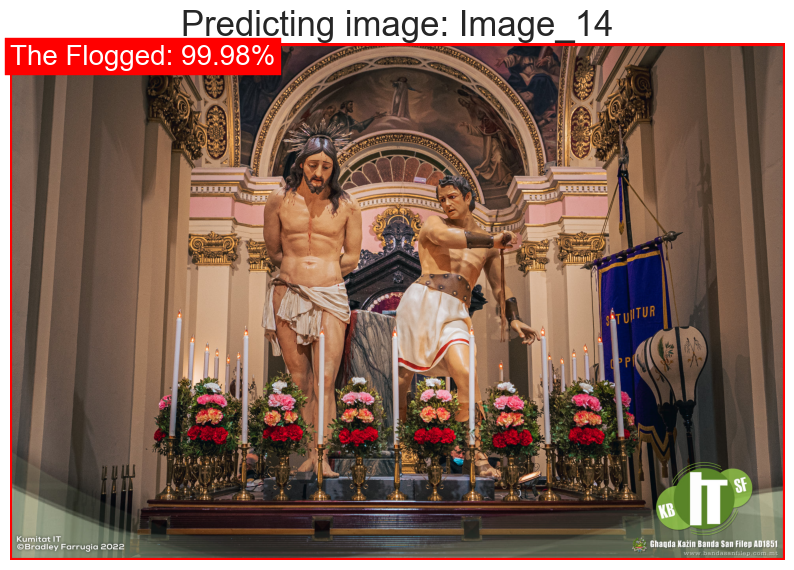

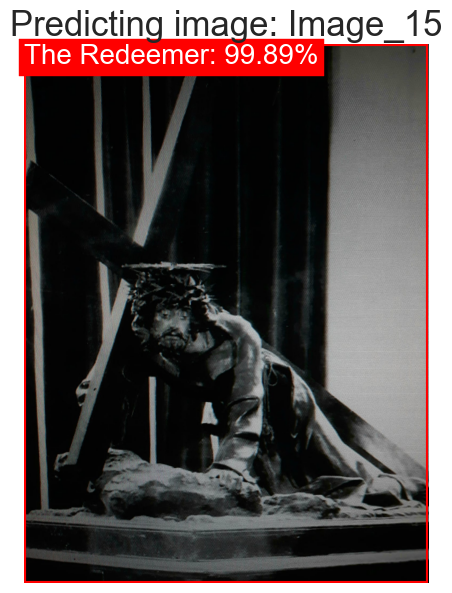

In [11]:
# Creating a dictionary of images based on a subset amount and loading from the directory
subset_amount = 15

# Retrieving the images without resize
testing_images = []

# Iterating through the categories
for category in categories:
    # Retrieving the images in each category directory
    image_names = os.listdir(os.path.join(dataset_path, category))
    
    # Iterating through the images in the category
    for image_name in image_names[:subset_amount]:
        # Reading the image
        img_path = os.path.join(dataset_path, category, image_name)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Appending the image to the list
        testing_images.append(img)

# Randomly selecting a subset of images
subset_images_indices = np.random.choice(len(testing_images), subset_amount, replace=False)
subset_images = [testing_images[i] for i in subset_images_indices]

# Creating a dictionary of images
image_dict = {}
for i, image in enumerate(subset_images):
    image_dict[f'Image_{i+1}'] = image

# Loading the model
model = tf.keras.models.load_model('VGG16.h5')

# Predicting the classes of the images
predictions = predict(image_dict, model, do_save=True)